<a href="https://colab.research.google.com/github/hongxu-yn/Southeast-Asia-XCO2-STK-20260901/blob/main/src/step04_spatiotemporal_patterns.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Initialization

In [1]:
from google.colab import drive
!pip install -q netCDF4 joblib tqdm xarray pykrige gstools cartopy scipy regionmask

drive.mount('/content/drive')
print("✅ Drive mounted successfully and environment initialization complete!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.3/72.3 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 93.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.2/166.2 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 75.9 MB/s eta 0:00:00
Mounted at /content/drive
✅ Drive mounted successfully and environment initialization complete!


In [47]:
import yaml
import geopandas as gpd
from pathlib import Path
import os
import zipfile
import urllib.request
import warnings
from pathlib import Path

import numpy as np
import rasterio
from rasterio.enums import Resampling
import matplotlib as mpl        # <--- Add this line
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, Circle, Patch, ConnectionPatch
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.gridspec as gridspec
from shapely.geometry import box

warnings.filterwarnings("ignore")
mpl.rcParams.update({
    "font.size": 8,            # Global base font size
    "axes.labelsize": 8,       # Axis labels (xlabel, ylabel)
    "xtick.labelsize": 8,      # x-axis tick labels
    "ytick.labelsize": 8,      # y-axis tick labels
    "legend.fontsize": 8,      # Legend font size
    "axes.titlesize": 9,       # Subplot title (slightly larger for distinction)
    "axes.linewidth": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out"
})

plt.rcParams['axes.unicode_minus'] = False

def add_scalebar(ax, length_km=1000, location=(0.05, 0.05)):
    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())
    lon_s, lat_s = x0 + (x1-x0)*location[0], y0 + (y1-y0)*location[1]
    lon_e = lon_s + (length_km / (111.32 * np.cos(np.deg2rad(lat_s))))
    kw = dict(transform=ccrs.PlateCarree(), color='k', zorder=20)
    ax.plot([lon_s, lon_e], [lat_s, lat_s], lw=2, **kw)
    tick_h = (y1-y0)*0.025
    for x in [lon_s, lon_e]:
        ax.plot([x, x], [lat_s, lat_s + tick_h], lw=2, **kw)
    ax.text(lon_s, lat_s + tick_h, "0", transform=ccrs.PlateCarree(), ha='center', va='bottom')
    ax.text(lon_e, lat_s + tick_h, f"{length_km} km", transform=ccrs.PlateCarree(), ha='center', va='bottom')

def add_north_arrow(ax, location=(0.90, 0.90), size=0.1):
    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())
    lon, lat = x0 + (x1-x0)*location[0], y0 + (y1-y0)*location[1]
    h, w = (y1-y0)*size, (y1-y0)*size*0.25
    kw = dict(transform=ccrs.PlateCarree(), color='k', zorder=25)
    ax.add_patch(Polygon([(lon, lat), (lon-w, lat-h), (lon, lat-h*0.7)], fc='k', **kw))
    ax.add_patch(Polygon([(lon, lat), (lon, lat-h*0.7), (lon+w, lat-h)], fc='w', ec='k', lw=0.6, **kw))
    ax.text(lon, lat + (y1-y0)*0.01, 'N', ha='center', va='bottom', transform=ccrs.PlateCarree(), zorder=26)

CONFIG_PATH = Path("/content/drive/MyDrive/Southeast_Asia_XCO2_STK/src/config.yaml")

with open(CONFIG_PATH, "r", encoding="utf-8") as f:
    config = yaml.safe_load(f)


PROJECT_DIR = Path(config['project_root'])

PROC_DIR = PROJECT_DIR / config['paths']['output']['trend']
PROC_DIR.mkdir(parents=True, exist_ok=True)  # Ensure output directory exists

gis_dir = PROJECT_DIR / config['paths']['gis']

cams_nc = PROJECT_DIR / config['paths']['data']['cams_nc']
stk_nc = PROJECT_DIR / config['paths']['output']['stk_nc']

DOC_DIR = PROJECT_DIR / config['paths']['docs']
DOC_DIR.mkdir(parents=True, exist_ok=True)

sat_root = PROJECT_DIR / config["paths"]["data"]["Satellite"]["root"]
sat_raw = PROJECT_DIR / config["paths"]["data"]["Satellite"]["raw"]
sat_qc = PROJECT_DIR / config["paths"]["data"]["Satellite"]["step01_QA_Control"]
sat_grid = PROJECT_DIR / config["paths"]["data"]["Satellite"]["step02_grid"]
sat_keeling = PROJECT_DIR / config["paths"]["data"]["Satellite"]["step03_Keeling_curve"]

REGIONS = {}
for name, attrs in config['regions'].items():
    shp_path = gis_dir / attrs['shp']
    gdf = gpd.read_file(shp_path) if shp_path.exists() else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")
    REGIONS[name] = (gdf, attrs['color'])


CITIES = config['cities']
STATIONS = config['stations']
LABELS = [(lbl['lon'], lbl['lat'], lbl['text'], lbl['color']) for lbl in config['labels']]
SITE_META = {station['site']: station['meta'] for station in STATIONS}

print(f"Configuration loaded successfully!")
print(f"Target output directory: {PROC_DIR}")
print(f"Loaded {len(CITIES)} cities and {len(STATIONS)} observation stations.")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Southeast_Asia_XCO2_STK/src/config.yaml'

# Annual mean spatial distribution of OCO-2 and OCO-3 on a 0.1-degree grid

OCO-2 years: [2015 2016 2017 2018 2019 2020 2021 2022 2023 2024]


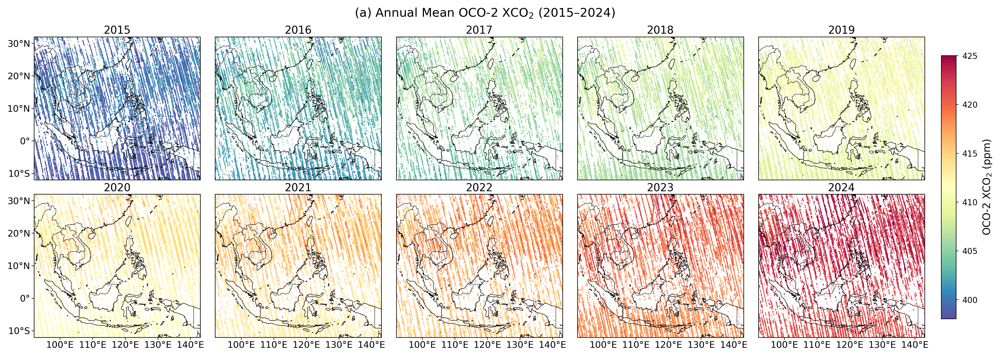

Saved to: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/trend/(a)_annual_mean_oco2_2015_2024.png
OCO-3 years: [2020 2021 2022 2023 2024]


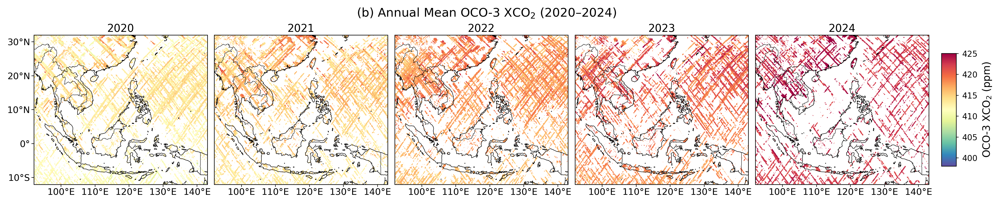

Saved to: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/trend/(b)_annual_mean_oco3_2020_2024.png


In [ ]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from pathlib import Path

oco2_daily_nc = sat_grid / "oco2_xco2_daily_201409_202512.nc"
oco3_daily_nc = sat_grid / "oco3_xco2_daily_201908_202512.nc"

var_name = "xco2"
extent = [92, 143, -12, 32]
n_cols = 5

# =========================
# 1. Precompute annual means for both sensors
# =========================
annual_mean_dict = {}

for sat_name in ["OCO-2", "OCO-3"]:
    if sat_name == "OCO-2":
        nc_fn = oco2_daily_nc
        year_slice = slice(2015, 2024)
    else:
        nc_fn = oco3_daily_nc
        year_slice = slice(2020, 2024)

    ds = xr.open_dataset(nc_fn)
    da = ds[var_name]

    if "longitude" in da.dims:
        da = da.rename({"longitude": "lon"})
    if "latitude" in da.dims:
        da = da.rename({"latitude": "lat"})
    if da.lat.values[0] > da.lat.values[-1]:
        da = da.sortby("lat")

    lon_min, lon_max, lat_min, lat_max = extent
    da = da.sel(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max))
    da["time"] = pd.to_datetime(da["time"].values)

    annual_mean = da.groupby("time.year").mean("time", skipna=True)
    annual_mean = annual_mean.sel(year=year_slice)

    annual_mean_dict[sat_name] = annual_mean
    ds.close()

# =========================
# 2. Use a consistent color scale
# =========================
all_vals = np.concatenate([
    annual_mean_dict["OCO-2"].values.ravel(),
    annual_mean_dict["OCO-3"].values.ravel()
])
all_vals = all_vals[np.isfinite(all_vals)]

vmin = float(np.nanpercentile(all_vals, 1))
vmax = float(np.nanpercentile(all_vals, 99))
cmap = mpl.colormaps["Spectral_r"]

# Optional: fix to a manual range if needed
# vmin, vmax = 404, 422

for k, sat_name in enumerate(["OCO-2", "OCO-3"]):
    annual_mean = annual_mean_dict[sat_name]

    years = annual_mean["year"].values
    n_panels = len(years)
    n_rows = int(np.ceil(n_panels / n_cols))

    print(f"{sat_name} years:", years)

    left, right = 0.07, 0.92
    bottom, top = 0.09, 0.90

    fig = plt.figure(figsize=(2.9 * n_cols, 2.55 * n_rows), dpi=300)
    gs = gridspec.GridSpec(
        n_rows, n_cols,
        left=left, right=right,
        bottom=bottom, top=top,
        wspace=0.04, hspace=0.1
    )

    proj = ccrs.PlateCarree()
    axes = []

    for i, year in enumerate(years):
        row = i // n_cols
        col = i % n_cols
        ax = fig.add_subplot(gs[row, col], projection=proj)
        axes.append(ax)

        data_i = annual_mean.sel(year=year)

        im = ax.pcolormesh(
            data_i["lon"], data_i["lat"], data_i,
            transform=proj,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            shading="auto",
            rasterized=True
        )

        ax.set_extent(extent, crs=proj)
        ax.coastlines(resolution="50m", linewidth=0.45, color="black")
        ax.add_feature(
            cfeature.BORDERS.with_scale("50m"),
            linewidth=0.35,
            edgecolor="black"
        )
        ax.add_feature(
            cfeature.LAND.with_scale("50m"),
            facecolor="none",
            edgecolor="none"
        )

        xticks = [100, 110, 120, 130, 140]
        yticks = [-10, 0, 10, 20, 30]

        ax.set_xticks(xticks, crs=proj)
        ax.set_yticks(yticks, crs=proj)
        ax.xaxis.set_major_formatter(LongitudeFormatter())
        ax.yaxis.set_major_formatter(LatitudeFormatter())

        ax.tick_params(
            axis="both",
            which="major",
            labelsize=9,
            length=2.5,
            width=0.55,
            pad=1.2
        )

        # Keep only outer ticks/labels
        if col != 0:
            ax.tick_params(axis="y", which="both", left=False, labelleft=False)
        if row != n_rows - 1:
            ax.tick_params(axis="x", which="both", bottom=False, labelbottom=False)

        # Thin map frame
        ax.spines["geo"].set_linewidth(0.6)

        # Panel year title
        ax.set_title(f"{year}", fontsize=10.5, pad=3)

    # Remove empty axes if any
    total_slots = n_rows * n_cols
    if n_panels < total_slots:
        for j in range(n_panels, total_slots):
            row = j // n_cols
            col = j % n_cols
            ax_empty = fig.add_subplot(gs[row, col], projection=proj)
            ax_empty.set_visible(False)

    # =========================
    # 3. Adaptive colorbar
    # =========================
    cbar_gap = 0.012
    cbar_width = 0.014
    cbar_left = right + cbar_gap

    if n_rows == 1:
        cbar_bottom = bottom + 0.10
        cbar_height = (top - bottom) - 0.20
    elif n_rows == 2:
        cbar_bottom = bottom + 0.05
        cbar_height = (top - bottom) - 0.10
    else:
        cbar_bottom = bottom + 0.03
        cbar_height = (top - bottom) - 0.06

    cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
    cb = fig.colorbar(im, cax=cax, orientation="vertical")
    cb.set_label(f"{sat_name} XCO$_2$ (ppm)", fontsize=10)
    cb.ax.tick_params(labelsize=8, length=2.5, width=0.55)
    cb.outline.set_linewidth(0.6)

    # =========================
    # 4. Suptitle
    # =========================
    year_min = int(years.min())
    year_max = int(years.max())
    panel_label = f"({chr(97 + k)})"

    if n_rows == 1:
        title_y = 1.05
    elif n_rows == 2:
        title_y = 0.98
    else:
        title_y = 0.935

    fig.suptitle(
        f"{panel_label} Annual Mean {sat_name} XCO$_2$ ({year_min}–{year_max})",
        fontsize=12,
        y=title_y
    )

    out_fig = PROC_DIR / f"{panel_label}_annual_mean_{sat_name.lower().replace('-', '').replace(' ', '_')}_{year_min}_{year_max}.png"
    fig.savefig(out_fig, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)

    print(f"Saved to: {out_fig}")

#  valid-data percentages

Annual and multi-year mean monthly valid-data percentages for 0.1° × 0.1° gridded OCO-2 and OCO-3 XCO$_2$.


Processing OCO-2...
Processing OCO-3...

Annual coverage rate (%)
 year     OCO-2     OCO-3
 2015 43.554367       NaN
 2016 37.117201       NaN
 2017 30.016043       NaN
 2018 38.608289       NaN
 2019 45.336007       NaN
 2020 38.511586 31.352496
 2021 35.544563 29.205437
 2022 32.240642 30.992870
 2023 38.493761 26.137255
 2024 36.856506 17.264260

Monthly mean coverage rate (%)
 month    OCO-2    OCO-3
     1 4.301070 1.979501
     2 4.465330 3.028342
     3 5.177496 2.655971
     4 4.792112 4.652050
     5 4.315062 1.626292
     6 3.883779 3.635205
     7 4.229456 1.392424
     8 3.755793 4.186809
     9 4.016711 2.186364
    10 4.199064 4.309893
    11 4.354367 2.432977
    12 3.904857 2.689750


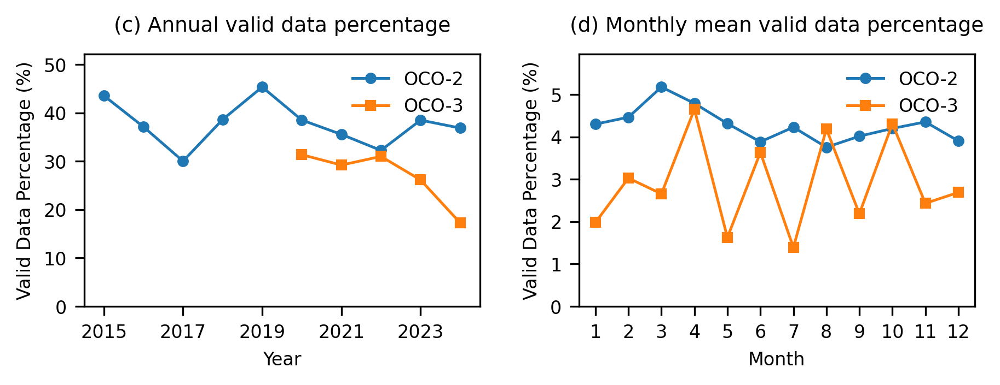


Saved figure to: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/trend/valid_data_percentage.png


In [ ]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from pathlib import Path

extent = [92, 143, -12, 32]
var_name = "xco2"

oco2_nc = sat_grid / "oco2_xco2_daily_201409_202512.nc"
oco3_nc = sat_grid / "oco3_xco2_daily_201908_202512.nc"

def process_satellite_coverage(file_path, var_name, sat_name, extent, time_slice):
    lon_min, lon_max, lat_min, lat_max = extent

    with xr.open_dataset(file_path) as ds:
        da = ds[var_name]

        renames = {k: v for k, v in {"longitude": "lon", "latitude": "lat"}.items() if k in da.dims}
        if renames:
            da = da.rename(renames)

        if da.lat.values[0] > da.lat.values[-1]:
            da = da.sortby("lat")

        if not np.issubdtype(da.time.dtype, np.datetime64):
            da["time"] = pd.to_datetime(da["time"].values)

        da = da.sel(
            lon=slice(lon_min, lon_max),
            lat=slice(lat_min, lat_max),
            time=slice(*time_slice)
        ).load()

        total_pixels = da.sizes["lat"] * da.sizes["lon"]

        da_month = da.resample(time="MS").mean(skipna=True)
        valid_month = da_month.notnull().sum(dim=("lat", "lon"))

        pct_month = (valid_month / total_pixels * 100).to_dataframe(name=sat_name).reset_index()
        pct_month["month"] = pct_month["time"].dt.month
        df_month_clim = pct_month.groupby("month", as_index=False)[sat_name].mean()

        da_year = da_month.groupby("time.year").mean("time", skipna=True)
        valid_year = da_year.notnull().sum(dim=("lat", "lon"))

        df_year = (valid_year / total_pixels * 100).to_dataframe(name=sat_name).reset_index()

    return df_year, df_month_clim


print("Processing OCO-2...")
df2_year, df2_month_clim = process_satellite_coverage(
    oco2_nc, var_name, "OCO-2", extent, ("2015-01-01", "2024-12-31")
)

print("Processing OCO-3...")
df3_year, df3_month_clim = process_satellite_coverage(
    oco3_nc, var_name, "OCO-3", extent, ("2020-01-01", "2024-12-31")
)

df_year = pd.merge(df2_year, df3_year, on="year", how="outer").sort_values("year")
df_month = pd.merge(df2_month_clim, df3_month_clim, on="month", how="outer").sort_values("month")

print("\nAnnual coverage rate (%)")
print(df_year.to_string(index=False))

print("\nMonthly mean coverage rate (%)")
print(df_month.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(7, 2), dpi=300)
plt.subplots_adjust(wspace=0.25)

ax = axes[0]

x2 = df_year["year"].values
y2 = df_year["OCO-2"].values
mask2 = np.isfinite(y2)
ax.plot(x2[mask2], y2[mask2], marker="o", markersize=4, linewidth=1.2, label="OCO-2")

x3 = df_year["year"].values
y3 = df_year["OCO-3"].values
mask3 = np.isfinite(y3)
ax.plot(x3[mask3], y3[mask3], marker="s", markersize=4, linewidth=1.2, label="OCO-3")

ax.set_xlabel("Year")
ax.set_ylabel("Valid Data Percentage (%)")
ax.set_title("(c) Annual valid data percentage", pad=10)

min_year = int(df_year["year"].min())
max_year = int(df_year["year"].max())
ax.set_xticks(np.arange(min_year, max_year + 1, 2))

ax.set_xlim(df_year["year"].min() - 0.5, df_year["year"].max() + 0.5)
ax.set_ylim(0, max(np.nanmax(df_year["OCO-2"]), np.nanmax(df_year["OCO-3"])) * 1.15)
ax.tick_params(length=4, width=0.8)
ax.legend(loc="upper right", frameon=False)

ax = axes[1]

ax.plot(df_month["month"], df_month["OCO-2"], marker="o", markersize=4, linewidth=1.2, label="OCO-2")
ax.plot(df_month["month"], df_month["OCO-3"], marker="s", markersize=4, linewidth=1.2, label="OCO-3")

ax.set_xlabel("Month")
ax.set_ylabel("Valid Data Percentage (%)")
ax.set_title("(d) Monthly mean valid data percentage", pad=10)
ax.set_xticks(range(1, 13))
ax.set_xlim(0.5, 12.5)
ax.set_ylim(0, max(np.nanmax(df_month["OCO-2"]), np.nanmax(df_month["OCO-3"])) * 1.15)
ax.tick_params(length=4, width=0.8)
ax.legend(loc="upper right", frameon=False)

out_fig = PROC_DIR / "valid_data_percentage.png"
fig.savefig(out_fig, dpi=300, bbox_inches="tight")
plt.show()

print(f"\nSaved figure to: {out_fig}")

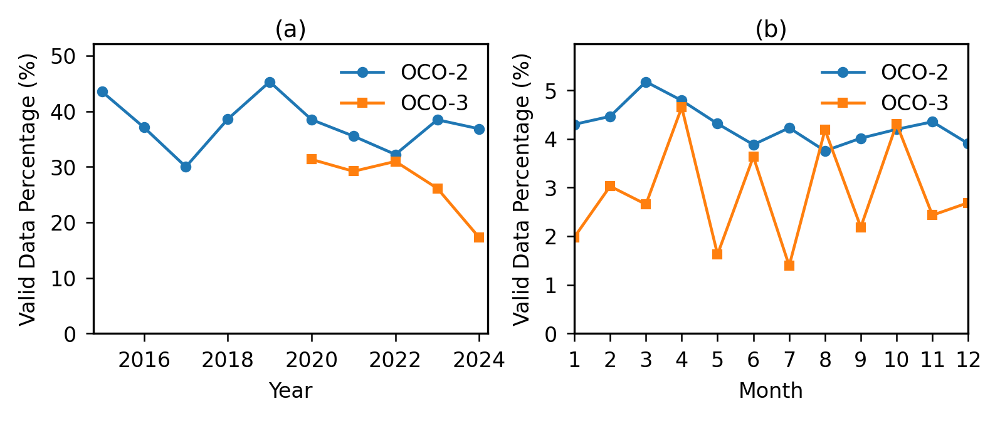

Saved to: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/docs/valid_data_percentage_annual_monthly.png


In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

mpl.rcParams.update({
    "font.size": 8,
    "axes.labelsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "axes.titlesize": 9,
    "axes.linewidth": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out"
})

fig, axes = plt.subplots(1, 2, figsize=(6, 2), dpi=300)
plt.subplots_adjust(wspace=0.22)

# =========================
# (a) Annual coverage
# =========================
ax = axes[0]

x2 = df_year["year"].values
y2 = df_year["OCO-2"].values
mask2 = np.isfinite(y2)
ax.plot(x2[mask2], y2[mask2], marker="o", markersize=3.2, linewidth=1.1, label="OCO-2")

x3 = df_year["year"].values
y3 = df_year["OCO-3"].values
mask3 = np.isfinite(y3)
ax.plot(x3[mask3], y3[mask3], marker="s", markersize=3.0, linewidth=1.1, label="OCO-3")

ax.set_xlabel("Year")
ax.set_ylabel("Valid Data Percentage (%)")
ax.set_title("(a)", pad=3)
ax.set_xlim(df_year["year"].min() - 0.2, df_year["year"].max() + 0.2)
ax.set_ylim(0, max(np.nanmax(df_year["OCO-2"]), np.nanmax(df_year["OCO-3"])) * 1.15)
ax.tick_params(length=3, width=0.6)
ax.legend(loc="upper right", frameon=False)

# =========================
# (b) Monthly mean coverage
# =========================
ax = axes[1]

ax.plot(df_month["month"], df_month["OCO-2"], marker="o", markersize=3.2, linewidth=1.1, label="OCO-2")
ax.plot(df_month["month"], df_month["OCO-3"], marker="s", markersize=3.0, linewidth=1.1, label="OCO-3")

ax.set_xlabel("Month")
ax.set_ylabel("Valid Data Percentage (%)")
ax.set_title("(b)", pad=3)
ax.set_xticks(range(1, 13))
ax.set_xlim(1, 12)
ax.set_ylim(0, max(np.nanmax(df_month["OCO-2"]), np.nanmax(df_month["OCO-3"])) * 1.15)
ax.tick_params(length=3, width=0.6)
ax.legend(loc="upper right", frameon=False)

out_fig = DOC_DIR / "valid_data_percentage_annual_monthly.png"
fig.savefig(out_fig, dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved to: {out_fig}")

# Geographic location of the study area

⏳ Downloading high-definition base map (approx. 20MB)...


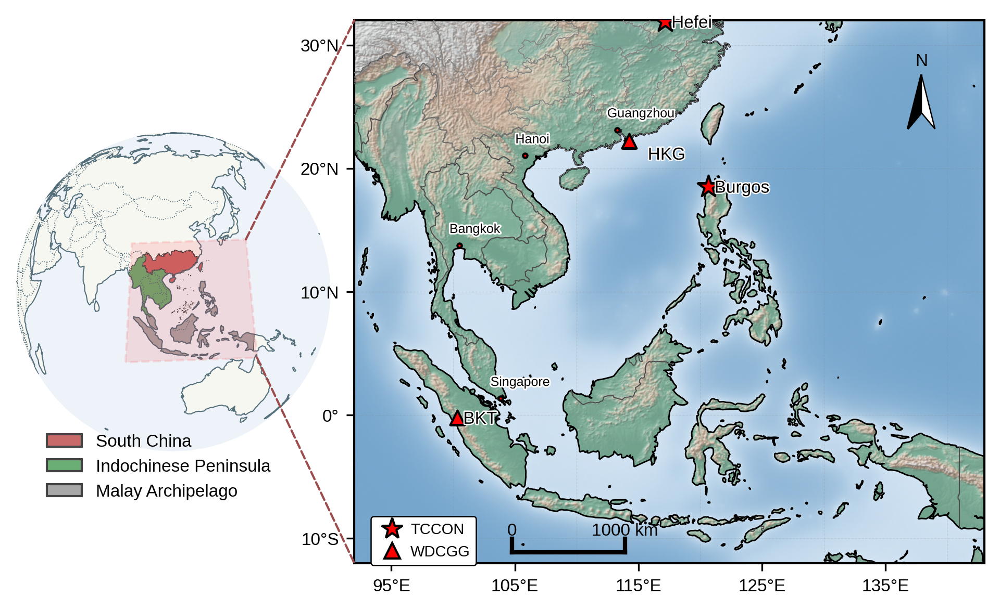

In [36]:
import os
import re
import zipfile
import urllib.request
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import xarray as xr
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.lines as mlines
import matplotlib.gridspec as gridspec
from rasterio.enums import Resampling
from matplotlib.patches import Polygon, Circle, Patch, ConnectionPatch
from shapely.geometry import box

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

warnings.filterwarnings("ignore")

COLORS = {
    "south": '#c96a6a',
    "indo":  '#6aae75',
    "malay": '#a8a8a8',
    "ocean": '#edf3f8',
    "land":  '#f7f7f2',
    "coast": '#546e7a',
    "border": '#b8c2c8'
}

EXTENT_REGIONAL = [92, 143, -12, 32]
lon_min, lon_max, lat_min, lat_max = EXTENT_REGIONAL

def get_online_ne_basemap():
    save_dir, tif_name = "./ne_basemap_cache", "HYP_50M_SR_W.tif"
    tif_path = os.path.join(save_dir, tif_name)
    url = "https://naturalearth.s3.amazonaws.com/50m_raster/HYP_50M_SR_W.zip"

    if not os.path.exists(tif_path):
        os.makedirs(save_dir, exist_ok=True)
        zip_path = tif_path.replace(".tif", ".zip")
        print(f"⏳ Downloading high-definition base map (approx. 20MB)...")
        urllib.request.urlretrieve(url, zip_path)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(save_dir)
        os.remove(zip_path)
    return tif_path

def add_local_tif_basemap(ax, tif_path, zorder=0, alpha=1.0, downsample=1):
    if not tif_path or not os.path.exists(tif_path):
        ax.stock_img()
        return
    with rasterio.open(tif_path) as src:
        bounds = src.bounds
        out_shape = (src.count, int(src.height/downsample), int(src.width/downsample))
        img = src.read(out_shape=out_shape, resampling=Resampling.bilinear)
        rgb = np.transpose(img[:3], (1, 2, 0)).astype(np.float32) / 255.0
        ax.imshow(rgb, origin="upper", extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                  transform=ccrs.PlateCarree(), zorder=zorder, alpha=alpha)


def add_dual_label(ax, lon, lat, zh, en, size_zh=10, size_en=9, color='black', dy=-1.0):
    effects = [pe.withStroke(linewidth=2.2, foreground="white")]
    kwargs = dict(transform=ccrs.PlateCarree(), color=color, ha='center', va='center', zorder=25, path_effects=effects)
    ax.text(lon, lat + dy, en, fontsize=size_en, **kwargs)

def add_city_markers(ax, cities, size=6):
    effects = [pe.withStroke(linewidth=1.5, foreground="white")]
    for city in cities:
        lon, lat, en = city["lon"], city["lat"], city["en"]
        ax.plot(lon, lat, 'o', color='red', mec='black', ms=2, lw=0.35, transform=ccrs.PlateCarree(), zorder=35)
        ax.text(lon-0.8, lat + 0.8, en, transform=ccrs.PlateCarree(), fontsize=size, ha='left', va='bottom',
                zorder=35, path_effects=effects)

def add_obs_stat(ax, stations, fontsize=8):
    effects = [pe.withStroke(linewidth=1.2, foreground="white")]
    for st in stations:
        lon, lat, name = st['lon'], st['lat'], st['site']
        st_type = st.get('type', 'wdcgg').lower()
        label = re.sub(r'\d+', '', str(name))

        marker, color, s, z = ('*', 'red', 110, 34) if st_type == 'tccon' else ('^', 'red', 45, 32)
        ax.scatter(lon, lat, marker=marker, color=color, edgecolors='black', s=s, transform=ccrs.PlateCarree(), zorder=z)

        Dxy = 1 if label in ["HAT", "HKG"] else 0
        ax.text(lon + 0.5 + Dxy, lat - 0.5 - Dxy, label, transform=ccrs.PlateCarree(),
                fontsize=fontsize, color='black', zorder=z+1, path_effects=effects)

    legend_elements = [
        mlines.Line2D([0], [0], color='w', marker='*', markerfacecolor='red', markeredgecolor='black', markersize=10, label='TCCON'),
        mlines.Line2D([0], [0], color='w', marker='^', markerfacecolor='red', markeredgecolor='black', markersize=7, label='WDCGG')
    ]
    leg = ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.11, 0.1), fontsize=fontsize-1,
                    frameon=True, facecolor='white', edgecolor='black', framealpha=1.0, columnspacing=0.8, handletextpad=0.2)
    leg.get_frame().set_linewidth(0.6)


fig = plt.figure(figsize=(10, 5), dpi=300)
gs = gridspec.GridSpec(1, 2, width_ratios=[0.5, 1], wspace=0.05)

ax1 = fig.add_subplot(gs[0], projection=ccrs.Orthographic(110, 15))
ax1.set_global()
ax1.add_patch(Circle((0.5, 0.5), 0.5, transform=ax1.transAxes, facecolor='#edf3f8', zorder=-1))
ax1.add_feature(cfeature.LAND, facecolor='#f7f7f2', edgecolor='none', zorder=0)
ax1.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.4, edgecolor='#546e7a', zorder=4)
ax1.add_feature(cfeature.COASTLINE, lw=0.5, ec='#546e7a', zorder=3)

region_patches = []
for label, (gdf, col) in REGIONS.items():
    if not gdf.empty:
        gdf.plot(ax=ax1, facecolor=col, edgecolor='#444444',
                 linewidth=0.3, transform=ccrs.PlateCarree(), zorder=2)
        region_patches.append(Patch(facecolor=col, edgecolor='#444444', label=label))

if region_patches:
    ax1.legend(handles=region_patches,
               loc='lower left',
               bbox_to_anchor=(0.05, -0.2), # Adjust position below the globe
               frameon=False,
               fontsize=8,
               ncol=1) # If too crowded, change to ncol=3 for horizontal arrangement

gdf_extent = gpd.GeoDataFrame({'geometry': [box(lon_min, lat_min, lon_max, lat_max)]}, crs="EPSG:4326")
gdf_extent.plot(ax=ax1, facecolor='red', alpha=0.1, edgecolor='red', linewidth=1.0, linestyle='--', transform=ccrs.PlateCarree(), zorder=5)
ax1.spines['geo'].set_visible(False)

ax2 = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())
ax2.set_extent(EXTENT_REGIONAL, crs=ccrs.PlateCarree())
add_local_tif_basemap(ax2, get_online_ne_basemap(), zorder=0, downsample=2)
ax2.add_feature(cfeature.COASTLINE.with_scale('50m'), lw=0.7, ec='black', zorder=10)
ax2.add_feature(cfeature.BORDERS.with_scale('50m'), lw=0.5, ec='0.3', zorder=10)

shp_file = shpreader.natural_earth(resolution='50m', category='cultural', name='admin_1_states_provinces')
reader = shpreader.Reader(shp_file)
provinces_cn = [rec.geometry for rec in reader.records() if rec.attributes['admin'] == 'China']
ax2.add_geometries(provinces_cn, crs=ccrs.PlateCarree(), edgecolor='gray', linewidth=0.3, facecolor='none', zorder=12)


add_city_markers(ax2, CITIES, size=6)
add_obs_stat(ax2, STATIONS, fontsize=8)
for lon, lat, _, col in LABELS:
    add_dual_label(ax2, lon, lat, "", "", size_zh=9, color=col)


ax2.set_xticks([95, 105, 115, 125, 135], crs=ccrs.PlateCarree())
ax2.set_yticks([-10, 0, 10, 20, 30], crs=ccrs.PlateCarree())
ax2.xaxis.set_major_formatter(LongitudeFormatter())
ax2.yaxis.set_major_formatter(LatitudeFormatter())
ax2.tick_params(labelsize=8)
ax2.gridlines(lw=0.3, color='gray', alpha=0.2, ls='--')

add_scalebar(ax2, 1000, (0.25, 0.02))
add_north_arrow(ax2, location=(0.9, 0.9))

trans1 = ccrs.PlateCarree()._as_mpl_transform(ax1)
trans2 = ccrs.PlateCarree()._as_mpl_transform(ax2)
kw_line = dict(axesA=ax1, axesB=ax2, color='#9c4c4c', lw=1.0, linestyle='--', zorder=100, clip_on=False)

fig.add_artist(ConnectionPatch(xyA=(lon_max, lat_max), xyB=(lon_min, lat_max), coordsA=trans1, coordsB=trans2, **kw_line))
fig.add_artist(ConnectionPatch(xyA=(lon_max, lat_min), xyB=(lon_min, lat_min), coordsA=trans1, coordsB=trans2, **kw_line))

for s in ax2.spines.values():
    s.set_linewidth(1.0)

png_fn = DOC_DIR / "location.png"
plt.savefig(png_fn, dpi=300, bbox_inches='tight')
plt.show()

#Pixel-wise calculation of the multi-year mean and interannual change rate.

In [18]:
import xarray as xr
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.stats import linregress

T0, T1 = "2015-01-01", "2024-12-31"     # 时间 2015–2024
extent = [92, 125, -10, 32]             # [lon0, lon1, lat0, lat1]
var_name = "xco2"

def calc_trend(y, years):
    m = np.isfinite(y)
    return linregress(years[m], y[m]).slope if m.sum() >= 5 else np.nan

for nc_path in [cams_nc, stk_nc]:
    label = "CAMS" if "cams" in nc_path.name.lower() else "STK"
    print(f"Processing {label} ...")

    with xr.open_dataset(nc_path) as ds:
        da = ds[var_name].copy()
        da["time"] = pd.to_datetime(da["time"].values)
        da = da.sel(time=slice(T0, T1), lon=slice(extent[0], extent[1]),
                    lat=slice(extent[2], extent[3]) if da.lat[0] < da.lat[-1] else slice(extent[3], extent[2]))

        da_year = da.groupby("time.year").mean("time", skipna=True)
        years = da_year["year"].values.astype(float)
        print(f"  Years: {years.astype(int).tolist()}")

        trend = xr.apply_ufunc(calc_trend, da_year, years,
                               input_core_dims=[["year"], ["year"]],
                               output_core_dims=[[]],
                               vectorize=True, output_dtypes=[float])

        ds_out = xr.Dataset({"mean": da_year.mean("year", skipna=True), "trend": trend},
                            coords={"lat": da.lat, "lon": da.lon})

        out_nc = PROC_DIR / f"{label.lower()}_trend_year_2015_2024.nc"
        ds_out.to_netcdf(out_nc)
        print(f"Saved: {out_nc}")

Processing CAMS ...
  Years: [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
Saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/cams_trend_year_2015_2024.nc
Processing STK ...
  Years: [2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
Saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/stk_trend_year_2015_2024.nc


#Calculate Regional Monthly Means


In [31]:
import xarray as xr
import pandas as pd
import numpy as np
import regionmask
import geopandas as gpd
from pathlib import Path

# ============================================================
# 参数：时间 2015–2024，空间 extent
# ============================================================
T0, T1 = "2015-01-01", "2024-12-31"
extent = [92, 125, -10, 32]   # [lon_min, lon_max, lat_min, lat_max]

gis_dir = PROJECT_DIR / "data/gis"
PROC_DIR = PROJECT_DIR / "output/processed"
PROC_DIR.mkdir(parents=True, exist_ok=True)

gdf_south     = gpd.read_file(gis_dir / "South_China.shp")       if (gis_dir / "South_China.shp").exists()       else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")
gdf_indochina = gpd.read_file(gis_dir / "Indochina.shp")         if (gis_dir / "Indochina.shp").exists()         else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")
gdf_malay     = gpd.read_file(gis_dir / "Malay_Archipelago.shp") if (gis_dir / "Malay_Archipelago.shp").exists() else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")

regions = {
    "Whole Area": None,
    "South China": gdf_south,
    "Indochina": gdf_indochina,
    "Malay Archipelago": gdf_malay,
}

for nc_path in [cams_nc, stk_nc]:

    label = "CAMS" if "cams" in nc_path.name.lower() else "STK"
    print(f"\n--- Processing {label} (Monthly Only) ---")
    save_path = PROC_DIR / f"{label.lower()}_xco2_month_2015_2024.csv"

    ds = xr.open_dataset(nc_path)
    da = ds[var_name]

    # ---- 统一时间并裁剪：时间 2015–2024 + 空间 extent ----
    da["time"] = pd.to_datetime(da["time"].values)
    da = (da.sel(time=slice(T0, T1))
            .sel(lon=slice(extent[0], extent[1])))
    lat_vals = da.lat.values
    lat_slice = slice(extent[2], extent[3]) if lat_vals[0] < lat_vals[-1] else slice(extent[3], extent[2])
    da = da.sel(lat=lat_slice)

    all_df = []
    for reg_name, gdf in regions.items():
        print(f"  Extracting: {reg_name}")

        if reg_name == "Whole Area":
            da_masked = da
        else:
            if gdf is None or gdf.empty:
                print(f"    ⚠️ Shapefile missing, skip {reg_name}")
                continue
            mask = regionmask.mask_3D_geopandas(gdf, da.lon, da.lat)
            da_masked = da.where(mask.isel(region=0))

        spatial_mean = da_masked.mean(dim=["lat", "lon"], skipna=True)

        monthly_series = (
            spatial_mean.resample(time="ME")
            .mean()
            .to_series()
        )

        all_df.append(monthly_series.to_frame(name=f"{reg_name}"))

    if all_df:
        df_final = pd.concat(all_df, axis=1)
        df_final.to_csv(save_path)
        print(f"✅ File saved: {save_path}")

print("\nAll tasks completed!")


--- Processing CAMS (Monthly Only) ---
  Extracting: Whole Area
  Extracting: South China
  Extracting: Indochina
  Extracting: Malay Archipelago
✅ File saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/cams_xco2_month_2015_2024.csv

--- Processing STK (Monthly Only) ---
  Extracting: Whole Area
  Extracting: South China
  Extracting: Indochina
  Extracting: Malay Archipelago
✅ File saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/stk_xco2_month_2015_2024.csv

All tasks completed!


# Plot Map of Spatiotemporal_Patterns_of_XCO2 for CAMS and STK

PNG: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/doc/Spatiotemporal_Patterns_of_XCO2_SCI_v4.png
PDF: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/doc/Spatiotemporal_Patterns_of_XCO2_SCI_v4.pdf


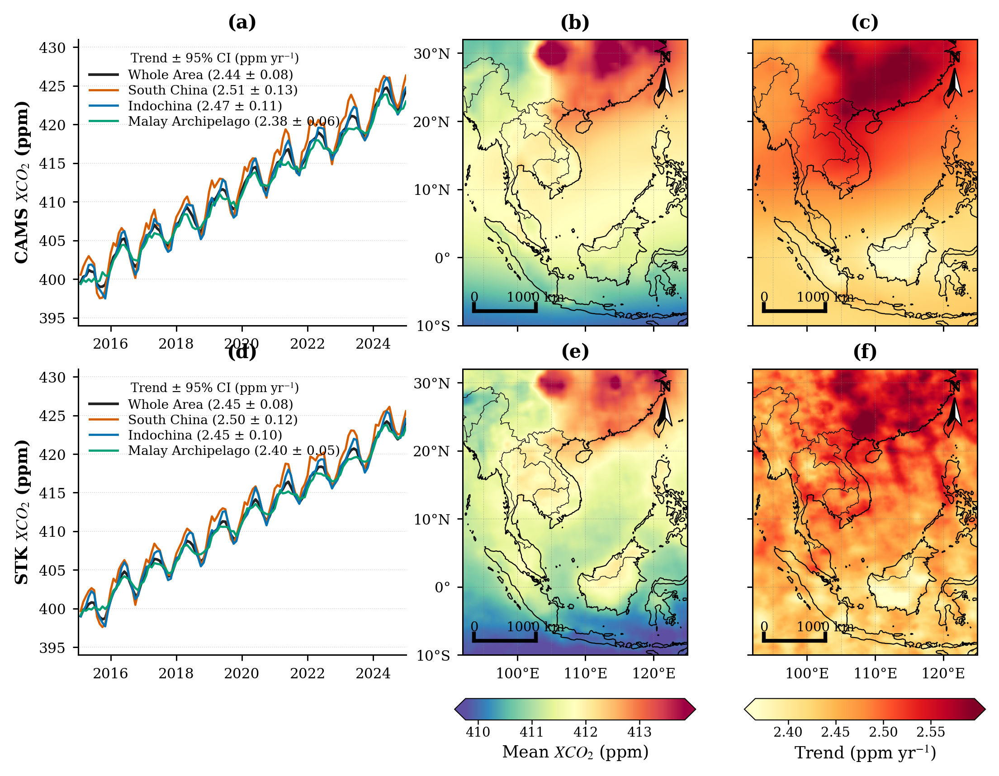

In [48]:
import warnings
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from scipy.stats import linregress, t
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Polygon
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

warnings.filterwarnings("ignore")


# ============================================================
# 1. Style
# ============================================================
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "DejaVu Serif"],
    "mathtext.fontset": "stix",
    "font.size": 8.2,
    "axes.labelsize": 8.8,
    "xtick.labelsize": 7.5,
    "ytick.labelsize": 7.5,
    "legend.fontsize": 6.8,
    "axes.linewidth": 0.75,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "xtick.major.width": 0.7,
    "ytick.major.width": 0.7,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "savefig.dpi": 600
})


# ============================================================
# 2. Parameters
# ============================================================
rows = ["cams", "stk"]

regions = [
    "Whole Area",
    "South China",
    "Indochina",
    "Malay Archipelago"
]

colors = [
    "#222222",
    "#D55E00",
    "#0072B2",
    "#009E73"
]

extent = [92, 125, -10, 32]


# ============================================================
# 3. Read data
# ============================================================
data = {}

for key in rows:
    ts = pd.read_csv(
        PROC_DIR / f"{key}_xco2_month_2015_2024.csv",
        index_col=0,
        parse_dates=True
    ).sort_index()

    ds = xr.open_dataset(
        PROC_DIR / f"{key}_trend_year_2015_2024.nc"
    )

    data[key] = {"ts": ts, "ds": ds}


# ============================================================
# 4. Shared color ranges
# ============================================================
mean_all = np.concatenate([
    data[k]["ds"]["mean"].values.ravel() for k in rows
])

trend_all = np.concatenate([
    data[k]["ds"]["trend"].values.ravel() for k in rows
])

mean_all = mean_all[np.isfinite(mean_all)]
trend_all = trend_all[np.isfinite(trend_all)]

vmin_mean, vmax_mean = np.nanpercentile(mean_all, [1, 99])
vmin_trend, vmax_trend = np.nanpercentile(trend_all, [1, 99])


# ============================================================
# 5. Shared Y range
# ============================================================
ts_all = []

for key in rows:
    for reg in regions:
        if reg in data[key]["ts"].columns:
            ts_all.extend(data[key]["ts"][reg].dropna().values)

ymin = np.floor(np.min(ts_all) / 5) * 5 - 1
ymax = np.ceil(np.max(ts_all) / 5) * 5 + 1


# ============================================================
# 6. Trend + 95% CI
# ============================================================
def trend_ci(dates, y):
    y = np.asarray(y, float)
    mask = np.isfinite(y)

    if mask.sum() < 3:
        return np.nan, np.nan

    dates = pd.DatetimeIndex(dates)
    x = ((dates - dates[0]).days / 365.2425).to_numpy()

    res = linregress(x[mask], y[mask])
    ci = t.ppf(0.975, mask.sum() - 2) * res.stderr

    return res.slope, ci


# ============================================================
# 7. Map setting
# ============================================================
def setup_map(ax, show_x=True, show_y=True):
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    ax.add_feature(
        cfeature.COASTLINE.with_scale("50m"),
        linewidth=0.55, edgecolor="black", zorder=3
    )

    ax.add_feature(
        cfeature.BORDERS.with_scale("50m"),
        linewidth=0.35, edgecolor="black", zorder=3
    )

    ax.set_xticks([100, 110, 120], crs=ccrs.PlateCarree())
    ax.set_yticks([-10, 0, 10, 20, 30], crs=ccrs.PlateCarree())

    ax.xaxis.set_major_formatter(
        LongitudeFormatter(degree_symbol="°", number_format=".0f")
    )
    ax.yaxis.set_major_formatter(
        LatitudeFormatter(degree_symbol="°", number_format=".0f")
    )

    ax.tick_params(axis="x", labelbottom=show_x, length=3, width=0.7)
    ax.tick_params(axis="y", labelleft=show_y, length=3, width=0.7)

    ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,
        linewidth=0.25,
        color="gray",
        alpha=0.4,
        linestyle="--"
    )


# ============================================================
# 8. Panel label — 顶部居中
# ============================================================
def panel_label(ax, text):
    ax.text(
        0.5, 1.025, text,
        transform=ax.transAxes,
        ha="center", va="bottom",
        fontsize=10,
        fontweight="bold"
    )


# ============================================================
# 9. Scale bar — 使用你提供的样式
# ============================================================
def add_scalebar(ax, length_km=1000, location=(0.05, 0.05)):
    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())

    lon_s = x0 + (x1 - x0) * location[0]
    lat_s = y0 + (y1 - y0) * location[1]

    lon_e = lon_s + (
        length_km /
        (111.32 * np.cos(np.deg2rad(lat_s)))
    )

    kw = dict(
        transform=ccrs.PlateCarree(),
        color="k",
        zorder=20
    )

    ax.plot(
        [lon_s, lon_e],
        [lat_s, lat_s],
        lw=2,
        **kw
    )

    tick_h = (y1 - y0) * 0.025

    for x in [lon_s, lon_e]:
        ax.plot(
            [x, x],
            [lat_s, lat_s + tick_h],
            lw=2,
            **kw
        )

    ax.text(
        lon_s,
        lat_s + tick_h,
        "0",
        transform=ccrs.PlateCarree(),
        ha="center",
        va="bottom",
        fontsize=7
    )

    ax.text(
        lon_e,
        lat_s + tick_h,
        f"{length_km} km",
        transform=ccrs.PlateCarree(),
        ha="center",
        va="bottom",
        fontsize=7
    )


# ============================================================
# 10. North arrow — 使用你提供的样式
# ============================================================
def add_north_arrow(ax, location=(0.90, 0.90), size=0.10):
    x0, x1, y0, y1 = ax.get_extent(ccrs.PlateCarree())

    lon = x0 + (x1 - x0) * location[0]
    lat = y0 + (y1 - y0) * location[1]

    h = (y1 - y0) * size
    w = h * 0.25

    transform = ccrs.PlateCarree()

    # 黑色左半部分
    ax.add_patch(
        Polygon(
            [(lon, lat),
             (lon - w, lat - h),
             (lon, lat - h * 0.7)],
            closed=True,
            facecolor="black",
            edgecolor="black",
            transform=transform,
            zorder=25
        )
    )

    # 白色右半部分
    ax.add_patch(
        Polygon(
            [(lon, lat),
             (lon, lat - h * 0.7),
             (lon + w, lat - h)],
            closed=True,
            facecolor="white",
            edgecolor="black",
            linewidth=0.6,
            transform=transform,
            zorder=25
        )
    )

    ax.text(
        lon,
        lat + (y1 - y0) * 0.01,
        "N",
        ha="center",
        va="bottom",
        fontsize=8,
        fontweight="bold",
        transform=transform,
        zorder=26
    )


# ============================================================
# 11. Figure
# ============================================================
fig = plt.figure(figsize=(7.35, 5.7), dpi=300)

gs = GridSpec(
    3, 3,
    figure=fig,
    width_ratios=[1.36, 1, 1],
    height_ratios=[1, 1, 0.075],
    hspace=0.22,
    wspace=0.18
)

labels = [
    ["(a)", "(b)", "(c)"],
    ["(d)", "(e)", "(f)"]
]

mean_im = None
trend_im = None


# ============================================================
# 12. Main panels
# ============================================================
for i, key in enumerate(rows):

    ts = data[key]["ts"]
    ds = data[key]["ds"]

    # --------------------------------------------------------
    # Time series
    # --------------------------------------------------------
    ax1 = fig.add_subplot(gs[i, 0])

    for reg, color in zip(regions, colors):
        if reg not in ts.columns:
            continue

        y = ts[reg].values
        slope, ci = trend_ci(ts.index, y)

        lab = (
            f"{reg} ({slope:.2f} ± {ci:.2f})"
            if np.isfinite(slope) else reg
        )

        ax1.plot(
            ts.index,
            y,
            color=color,
            linewidth=1.4 if reg == "Whole Area" else 1.15,
            label=lab
        )

    ax1.set_xlim(
        pd.Timestamp("2015-01-01"),
        pd.Timestamp("2024-12-31")
    )

    ax1.set_ylim(ymin, ymax)

    ax1.set_yticks(
        np.arange(np.ceil(ymin / 5) * 5, ymax, 5)
    )

    ax1.xaxis.set_major_locator(mdates.YearLocator(2))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

    ax1.set_ylabel(
        rf"{key.upper()} $XCO_2$ (ppm)",
        fontweight="bold"
    )

    ax1.grid(
        axis="y",
        linestyle=":",
        linewidth=0.4,
        color="gray",
        alpha=0.35
    )

    ax1.spines["top"].set_visible(False)
    ax1.spines["right"].set_visible(False)

    ax1.legend(
        loc="upper left",
        title=r"Trend ± 95% CI (ppm yr$^{-1}$)",
        title_fontsize=6.5,
        frameon=False,
        handlelength=2.2,
        labelspacing=0.25
    )

    panel_label(ax1, labels[i][0])


    # --------------------------------------------------------
    # Mean XCO2
    # --------------------------------------------------------
    ax2 = fig.add_subplot(
        gs[i, 1],
        projection=ccrs.PlateCarree()
    )

    setup_map(
        ax2,
        show_x=(i == 1),
        show_y=True
    )

    mean_im = ax2.pcolormesh(
        ds.lon,
        ds.lat,
        ds["mean"],
        cmap="Spectral_r",
        vmin=vmin_mean,
        vmax=vmax_mean,
        shading="auto",
        transform=ccrs.PlateCarree(),
        rasterized=True,
        zorder=1
    )

    panel_label(ax2, labels[i][1])
    add_north_arrow(ax2)
    add_scalebar(ax2)


    # --------------------------------------------------------
    # Trend
    # --------------------------------------------------------
    ax3 = fig.add_subplot(
        gs[i, 2],
        projection=ccrs.PlateCarree()
    )

    setup_map(
        ax3,
        show_x=(i == 1),
        show_y=False
    )

    trend_im = ax3.pcolormesh(
        ds.lon,
        ds.lat,
        ds["trend"],
        cmap="YlOrRd",
        vmin=vmin_trend,
        vmax=vmax_trend,
        shading="auto",
        transform=ccrs.PlateCarree(),
        rasterized=True,
        zorder=1
    )

    panel_label(ax3, labels[i][2])
    add_north_arrow(ax3)
    add_scalebar(ax3)


# ============================================================
# 13. Shared colorbars
# ============================================================
fig.add_subplot(gs[2, 0]).axis("off")

cax1 = fig.add_subplot(gs[2, 1])

cb1 = fig.colorbar(
    mean_im,
    cax=cax1,
    orientation="horizontal",
    extend="both"
)

cb1.set_label(
    r"Mean $XCO_2$ (ppm)",
    labelpad=2
)

cb1.ax.tick_params(
    labelsize=7,
    length=2.5,
    width=0.6,
    pad=1
)

cb1.ax.xaxis.set_major_locator(
    mticker.MaxNLocator(5)
)

cb1.outline.set_linewidth(0.5)


cax2 = fig.add_subplot(gs[2, 2])

cb2 = fig.colorbar(
    trend_im,
    cax=cax2,
    orientation="horizontal",
    extend="both"
)

cb2.set_label(
    r"Trend (ppm yr$^{-1}$)",
    labelpad=2
)

cb2.ax.tick_params(
    labelsize=7,
    length=2.5,
    width=0.6,
    pad=1
)

cb2.ax.xaxis.set_major_locator(
    mticker.MaxNLocator(5)
)

cb2.outline.set_linewidth(0.5)


# ============================================================
# 14. Layout
# ============================================================
fig.subplots_adjust(
    left=0.075,
    right=0.985,
    top=0.955,
    bottom=0.075
)


# ============================================================
# 15. Save
# ============================================================
png_fn = DOC_DIR / "Spatiotemporal_Patterns_of_XCO2_SCI_v4.png"
pdf_fn = DOC_DIR / "Spatiotemporal_Patterns_of_XCO2_SCI_v4.pdf"

plt.savefig(
    png_fn,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.03
)

plt.savefig(
    pdf_fn,
    bbox_inches="tight",
    pad_inches=0.03
)

print("PNG:", png_fn)
print("PDF:", pdf_fn)

plt.show()


# ============================================================
# 16. Close
# ============================================================
for key in rows:
    data[key]["ds"].close()

In [ ]:
import xarray as xr
import pandas as pd
import numpy as np
import regionmask
import geopandas as gpd
from pathlib import Path

# ============================================================
# 参数：时间 2015–2024，空间 extent
# ============================================================
T0, T1 = "2015-01-01", "2024-12-31"
extent = [92, 125, -10, 32]   # [lon_min, lon_max, lat_min, lat_max]

gis_dir = PROJECT_DIR / "data/gis"
PROC_DIR = PROJECT_DIR / "output/processed"
PROC_DIR.mkdir(parents=True, exist_ok=True)

gdf_south     = gpd.read_file(gis_dir / "South_China.shp")       if (gis_dir / "South_China.shp").exists()       else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")
gdf_indochina = gpd.read_file(gis_dir / "Indochina.shp")         if (gis_dir / "Indochina.shp").exists()         else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")
gdf_malay     = gpd.read_file(gis_dir / "Malay_Archipelago.shp") if (gis_dir / "Malay_Archipelago.shp").exists() else gpd.GeoDataFrame({'geometry': []}, crs="EPSG:4326")

regions = {
    "Whole Area": None,
    "South China": gdf_south,
    "Indochina": gdf_indochina,
    "Malay Archipelago": gdf_malay,
}

for nc_path in [cams_nc, stk_nc]:

    label = "CAMS" if "cams" in nc_path.name.lower() else "STK"
    print(f"\n--- Processing {label} (Monthly Only) ---")
    save_path = PROC_DIR / f"{label.lower()}_xco2_month_2015_2024.csv"

    ds = xr.open_dataset(nc_path)
    da = ds[var_name]

    # ---- 统一时间并裁剪：时间 2015–2024 + 空间 extent ----
    da["time"] = pd.to_datetime(da["time"].values)
    da = (da.sel(time=slice(T0, T1))
            .sel(lon=slice(extent[0], extent[1])))
    lat_vals = da.lat.values
    lat_slice = slice(extent[2], extent[3]) if lat_vals[0] < lat_vals[-1] else slice(extent[3], extent[2])
    da = da.sel(lat=lat_slice)

    all_df = []
    for reg_name, gdf in regions.items():
        print(f"  Extracting: {reg_name}")

        if reg_name == "Whole Area":
            da_masked = da
        else:
            if gdf is None or gdf.empty:
                print(f"    ⚠️ Shapefile missing, skip {reg_name}")
                continue
            mask = regionmask.mask_3D_geopandas(gdf, da.lon, da.lat)
            da_masked = da.where(mask.isel(region=0))

        spatial_mean = da_masked.mean(dim=["lat", "lon"], skipna=True)

        monthly_series = (
            spatial_mean.resample(time="ME")
            .mean()
            .to_series()
        )

        all_df.append(monthly_series.to_frame(name=f"{reg_name}"))

    if all_df:
        df_final = pd.concat(all_df, axis=1)
        df_final.to_csv(save_path)
        print(f"✅ File saved: {save_path}")

print("\nAll tasks completed!")


--- Processing CAMS (Monthly Only) ---
  Extracting: Whole Area
  Extracting: South China
    ⚠️ Shapefile missing, skip South China
  Extracting: Indochina
    ⚠️ Shapefile missing, skip Indochina
  Extracting: Malay Archipelago
    ⚠️ Shapefile missing, skip Malay Archipelago
✅ File saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/cams_xco2_month_2015_2024.csv

--- Processing STK (Monthly Only) ---
  Extracting: Whole Area
  Extracting: South China
    ⚠️ Shapefile missing, skip South China
  Extracting: Indochina
    ⚠️ Shapefile missing, skip Indochina
  Extracting: Malay Archipelago
    ⚠️ Shapefile missing, skip Malay Archipelago
✅ File saved: /content/drive/MyDrive/Southeast-Asia-XCO2-STK/output/processed/stk_xco2_month_2015_2024.csv

All tasks completed!


#